# Открытие заведения общественного питания в Москве.

## Описание проекта.

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала мы подготовим исследование рынка Москвы, найдем интересные особенности и презентуем полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Нам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных.

Файл moscow_places.csv:

* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    + «Средний счёт: 1000–1500 ₽»;
    + «Цена чашки капучино: 130–220 ₽»;
    + «Цена бокала пива: 400–600 ₽».
    + и так далее;
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    + Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    + Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    + Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    + Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    + Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    + Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    + 0 — заведение не является сетевым
    + 1 — заведение является сетевым
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

## Цели исследования.
Проанализировать рынок и выбрать расположение, цены, а также оценить актуальность категории заведения в Москве.

## Ход исследования.
    
Подготовка данных: загрузка и изучение общей информации из представленной таблицы.
    
Подготовка данных: обработка пропущенных значений, корректировка типа данных, дубликатов и других аномалий.

Расширение набора данных: добавление дополнительных столбцов, таких как работает ли заведение крглосуточно или нет и другие.
    
Исследовательский анализ данных: изучение основных характеристик заведений, изучение характеристик в зависимости от расположения, категории и т.д., выявление аномалий.

## Загрузим данные и изучим общую информацию и выполним предобработку данных.

In [146]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [147]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import plotly.express as px
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
from plotly import graph_objects as go
import numpy as np

In [148]:
data = pd.read_csv('moscow_places.csv')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [149]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Выведем количество пропущенных значений для каждого столбца

In [150]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Оставим пропуски как есть, потому что ничем их нельзя заменить.Проверим на явные пропуски.

In [151]:
data.duplicated().sum()

0

Явных дубликатов нет. Проверим есть ли не явные дубликаты,  когда навание и адрес совпадают.

In [152]:
data['name'] = data['name'].str.lower()
data['address'] = data['address'].str.lower()
data[['name', 'address']].duplicated().sum()

4

Удалим неявные дубликаты.

In [153]:
data = data.drop_duplicates(subset=['name', 'address'])
data[['name', 'address']].duplicated().sum()

0

Проверим сколько заведений представлено.

In [154]:
data['name'].unique()

array(['wowфли', 'четыре комнаты', 'хазри', ..., 'миславнес', 'самовар',
       'kebab time'], dtype=object)

In [155]:
data['name'].nunique()

5512

Представлено 5512 заведений.Создадим столбец street с названиями улиц из столбца с адресом.

Добавим столбец street только с названиями улиц.

In [156]:
def splt(ad):
    a=ad.split(',')
    a[1]=a[1].strip()
    return a[1]

In [157]:
data['street']=data['address'].apply(splt)
data


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица


In [158]:

data.query('street == "проспект мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира
786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира
792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира
800,пян-се,быстрое питание,"москва, проспект мира, 119, стр. 27",Северо-Восточный административный округ,"ежедневно, 10:00–20:00",55.834563,37.613549,4.4,NaN,NaN,NaN,NaN,1,NaN,проспект мира
909,космос,кафе,"москва, проспект мира, 119, стр. 34",Северо-Восточный административный округ,вт-вс 10:45–21:00,55.835060,37.622033,3.8,NaN,NaN,NaN,NaN,0,NaN,проспект мира
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2568,ice embassy,кафе,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, круглосуточно",55.777311,37.636400,4.4,NaN,NaN,NaN,NaN,0,273.0,проспект мира
2571,"халва, сеть почтоматов",кафе,"москва, проспект мира, 146",Северо-Восточный административный округ,пн-пт 10:00–19:00,55.820575,37.641970,3.6,NaN,NaN,NaN,NaN,0,18.0,проспект мира
2572,ресторан,ресторан,"москва, проспект мира, 62, стр. 1",Центральный административный округ,NaN,55.785618,37.635511,4.3,NaN,NaN,NaN,NaN,0,200.0,проспект мира
4782,food embassy,ресторан,"москва, проспект мира, 26, стр. 2",Центральный административный округ,"ежедневно, 10:00–00:00",55.777224,37.636288,4.5,высокие,Средний счёт:2500–3000 ₽,2750.0,NaN,0,273.0,проспект мира


Проверим какие улицы получились, нету ли ошибок.

In [159]:
data.street.unique()

array(['улица дыбенко', 'клязьминская улица', 'улица маршала федоренко',
       ..., 'улица хлобыстова', 'новороссийская улица',
       'чонгарский бульвар'], dtype=object)

In [160]:
data.address.unique()

array(['москва, улица дыбенко, 7/1', 'москва, улица дыбенко, 36, корп. 1',
       'москва, клязьминская улица, 15', ...,
       'москва, улица лобачевского, 52, корп. 1',
       'москва, болотниковская улица, 52, корп. 2',
       'москва, чонгарский бульвар, 26а, корп. 1'], dtype=object)

In [161]:
data.street.nunique()

1447

Получилось 1448 улиц.

Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

* логическое значение True — если заведение работает ежедневно и круглосуточно;
* логическое значение False — в противоположном случае.

In [162]:
def dayandnight(x):
    if x=='ежедневно, круглосуточно':
        return True
    else:
        return False

In [163]:
data['is_24_7']=data['hours'].apply(dayandnight)

In [164]:

data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


Представлено 5512 заведений,расположенных на 1448 улиц.Из данных удалили 4 дубликата, пропоски оставили как есть. Добавила столбцы с названиями улиц и столбец, где указано работает ли заведение круглосуточно или нет.

## Выполним анализ данных.

Исследуем количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построем визуализации.

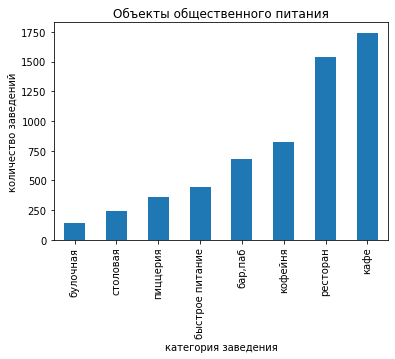

In [165]:
data.groupby('category').name.nunique().sort_values().plot.bar()

plt.xlabel('категория заведения')
plt.ylabel('количество заведений')
plt.title('Объекты общественного питания')

plt.show()

Чаще всего встречаются заведения из категории кафе.

Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построем визуализации. Проанализируем результаты и сделаем выводы.

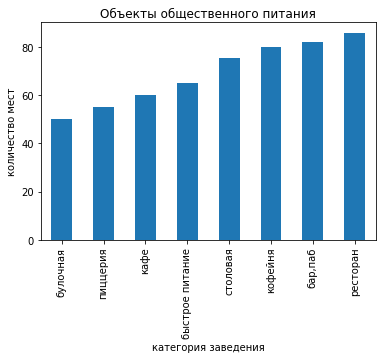

In [166]:
data.groupby('category').seats.median().sort_values().plot.bar()

plt.xlabel('категория заведения')
plt.ylabel('количество мест')
plt.title('Объекты общественного питания')

plt.show()

Больше всего мест в ресторане , меньше всего в булочной.

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете.

In [167]:
network = data.groupby('name').address.nunique().to_frame()
network

,address
name,
#кешбэккафе,1
+39 pizzeria mozzarella bar,1
1 этаж,1
1-я креветочная,1
10 идеальных пицц,3
...,...
ясно,1
яуза,1
ё-ланч,2


In [168]:
def net(address):
    if address > 1:
        return 'Сетевой'
    else:
        return 'Не сетевой'

In [169]:
network['networkone']=network['address'].apply(net)
network

,address,networkone
name,,
#кешбэккафе,1,Не сетевой
+39 pizzeria mozzarella bar,1,Не сетевой
1 этаж,1,Не сетевой
1-я креветочная,1,Не сетевой
10 идеальных пицц,3,Сетевой
...,...,...
ясно,1,Не сетевой
яуза,1,Не сетевой
ё-ланч,2,Сетевой


In [170]:
networkcircle=network.groupby('networkone').address.sum().to_frame().reset_index()

networkcircle

,networkone,address
0,Не сетевой,4760
1,Сетевой,3642


In [171]:
fig = go.Figure(data=[go.Pie(labels=networkcircle['networkone'], values=networkcircle['address'])])
fig.update_layout(title='Соотношение сетевых и не сетевых заведений')

fig.show()



Не сетевых заведений больше - 56.7% ,сетевых - 43.3%.

Исследуем какие категории заведений чаще являются сетевыми.

In [172]:
netcategory=network.merge(data[['name','category']], left_on='name', right_on='name')
netcategory1=netcategory[netcategory['networkone']=='Сетевой']
netcategory1

,name,address,networkone,category
4,10 идеальных пицц,3,Сетевой,ресторан
5,10 идеальных пицц,3,Сетевой,ресторан
6,10 идеальных пицц,3,Сетевой,ресторан
16,18 грамм,3,Сетевой,кофейня
17,18 грамм,3,Сетевой,кофейня
...,...,...,...,...
8384,японская кухня,4,Сетевой,ресторан
8397,ё-ланч,2,Сетевой,столовая
8398,ё-ланч,2,Сетевой,столовая
8400,ёрш,2,Сетевой,"бар,паб"


In [173]:
fig = go.Figure(data=[go.Pie(labels=netcategory1['category'], values=netcategory1['address'])])
fig.update_layout(title='Соотношение сетевых категорий заведений')

fig.show()

Чаще всего встречаются сетевые заведения кафе около 35,4%, и кофейня - 28,2%, меньше всего бар,паб - 1,29%.

In [174]:
#Код ревьюера
chain = data.groupby('category').agg({'chain':['count','sum']}).reset_index()
# считаем количество заведений по категориям и сколько из них сетевые

chain.columns = ['category','total_amnt','chain']
# переименовывем столбцы

chain['percent%'] = (chain['chain']/chain['total_amnt']*100).round(1)
# считаем долю сетевых от всех заведений в категориях, выводим на экран

chain = chain.sort_values(by='percent%',ascending=False)
display(chain.style.background_gradient(subset=['total_amnt','percent%'],cmap='Blues', axis=0))

order = list(chain['category'])
# список для сортировки графика

,category,total_amnt,chain,percent%
1,булочная,256,157,61.300000
5,пиццерия,633,330,52.100000
4,кофейня,1413,720,51.000000
2,быстрое питание,603,232,38.500000
6,ресторан,2042,729,35.700000
3,кафе,2376,779,32.800000
7,столовая,315,88,27.900000
0,"бар,паб",764,168,22.000000


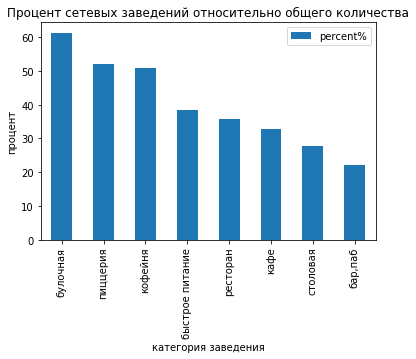

In [175]:
chain.plot.bar(x='category', y = 'percent%')
plt.xlabel('категория заведения')
plt.ylabel('процент')
plt.title('Процент сетевых заведений относительно общего количества')

plt.show()

Чаще всего встречаются сетевые заведения булочная  61,3%, меньше всего бар,паб - 22%.

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. 

In [176]:
netpopular=netcategory[netcategory['networkone']=='Сетевой'].groupby(['name', 'category']).address.sum().sort_values(ascending=False).head(15).to_frame().reset_index()

netpopular




,name,category,address
0,кафе,кафе,29704
1,шоколадница,кофейня,14280
2,домино'с пицца,пиццерия,5929
3,додо пицца,пиццерия,5476
4,one price coffee,кофейня,5184
5,яндекс лавка,ресторан,4761
6,cofix,кофейня,4225
7,prime,ресторан,2450
8,кофепорт,кофейня,1764
9,кулинарная лавка братьев караваевых,кафе,1521


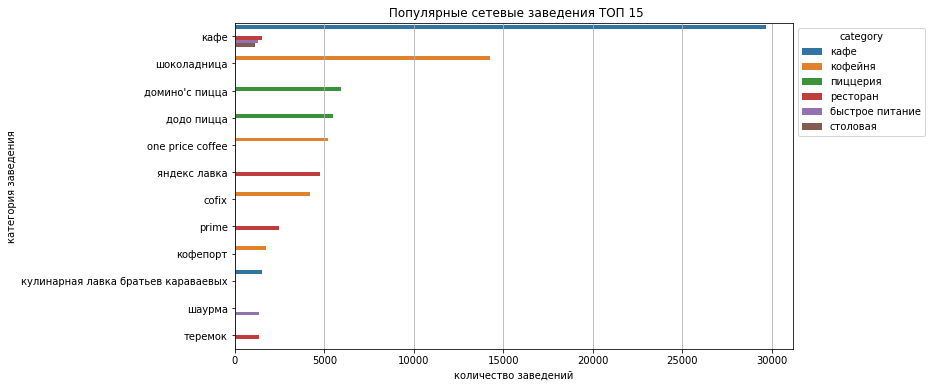

In [177]:
plt.figure(figsize=(10,6))
ax = sns.barplot(data=netpopular, y='name', x='address', hue='category', orient='h')
ax.set(xlabel='количество заведений', title=' Популярные сетевые заведения ТОП 15', ylabel='категория заведения')
ax.legend(title='category', bbox_to_anchor=(1, 1), loc='upper left')
ax.grid(axis='x')

Чаще всего встречаются кафе среди ТОП 15 заведений.На втором месте кофейне,менше всего быстрое питание и столовая.

Отобразим общее количество заведений и количество заведений каждой категории по районам. 

In [178]:
catdistrict=data.groupby(['district','category']).name.count().sort_values(ascending=False).to_frame().reset_index()

catdistrict

,district,category,name
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [179]:
fig = px.bar(catdistrict, x='district', y='name', color='category', title='Категории заведений по районам')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Округа', yaxis_title='Количество заведений')

fig.show() 


В Центральном округе представлены преобладают категории заведений: ресторан, кафе, кофейня, бар, паб. В Южном и Западном округах рестораны и кафе. В Юго-Восточном, Восточном, Северо-Восточном, Юго-Западных округах распространены кафе.

Визуализируем распределение средних рейтингов по категориям заведений.

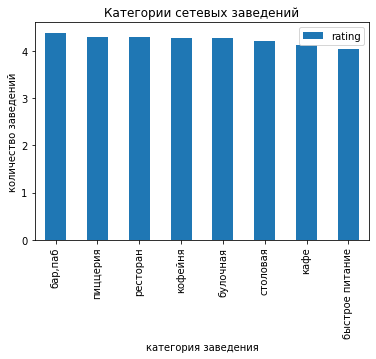

In [180]:
data.groupby('category').rating.mean().sort_values(ascending=False).to_frame().plot.bar()

plt.xlabel('категория заведения')
plt.ylabel('количество заведений')
plt.title('Категории сетевых заведений')

plt.show()



Усреднённые рейтинги в разных типах общепита почти ничем не отличаются.

Построем фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [181]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating')
rating_data['rating']=round(rating_data['rating'], 2)

rating_data

,district,rating
6,Юго-Восточный административный округ,4.10
3,Северо-Восточный административный округ,4.15
7,Юго-Западный административный округ,4.17
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
8,Южный административный округ,4.18
4,Северо-Западный административный округ,4.21
2,Северный административный округ,4.24
5,Центральный административный округ,4.38


In [182]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий рейтинг заведений в Центральном округе 4.38, меньше всего в  Юго-Восточном административном округе 4.10. В остальных районах рейтинг 4.3.

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [183]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Больше всего заведений расположено в центре москвы около 4000. Ближе к окраинам уже меньше 50-700 заведений.

Найдим топ-15 улиц по количеству заведений. Построем график распределения количества заведений и их категорий по этим улицам. 

In [184]:
catstreet=data.groupby(['street','category']).name.count().sort_values(ascending=False).head(15).to_frame().reset_index()

catstreet

,street,category,name
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,45
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
5,проспект вернадского,ресторан,33
6,ленинский проспект,ресторан,33
7,ленинградское шоссе,ресторан,26
8,ленинский проспект,кафе,26
9,люблинская улица,кафе,26


In [185]:
fig = px.bar(catstreet, x='street', y='name', color='category', title='Категории заведений по улицам ТОП 15')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Улицы', yaxis_title='Количество заведений')

fig.show()

На проспекте Мира больше всего заведения, которые входят в ТОП 15 в категориях кафе, ресторан, кофейня. Меньше всего - на Люблинской улице, где представлены кафе.

Найдем улицы, на которых находится только один объект общепита.

In [186]:
catstreet1=data.groupby(['street','category']).name.count().sort_values(ascending=False).to_frame().reset_index()
catstreet1=catstreet1.groupby('street').category.nunique().sort_values(ascending=False).to_frame().reset_index()

catstreet1

,street,category
0,кутузовский проспект,8
1,улица покровка,8
2,хорошёвское шоссе,8
3,уральская улица,8
4,рязанский проспект,8
...,...,...
1442,оренбургская улица,1
1443,орловский переулок,1
1444,оршанская улица,1
1445,осташковский проезд,1


In [187]:
catstreet1=catstreet1.merge(data[['street','category']], left_on='street', right_on='street', how='left')
catstreet1=catstreet1[catstreet1['category_x']==1]
catstreet1

,street,category_x,category_y
7760,челобитьевское шоссе,1,ресторан
7761,центральный парк культуры и отдыха имени м. го...,1,кафе
7762,улица пивченкова,1,булочная
7763,улица малая якиманка,1,ресторан
7764,улица петра романова,1,кофейня
...,...,...,...
8397,орловский переулок,1,кофейня
8398,оршанская улица,1,"бар,паб"
8399,осташковский проезд,1,ресторан
8400,осташковский проезд,1,ресторан


In [188]:
catstreet1.duplicated().sum()

106

In [189]:
catstreet1 = catstreet1.drop_duplicates()
catstreet1.duplicated().sum()

0

In [190]:
fig = px.bar(catstreet1, x='street', y='category_x', color='category_y', title='Категории заведений по улицам')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Улицы', yaxis_title='Количество заведений')

fig.show()

На тех улицах, на которых  по одному заведению, мы видим, что чаще всего это пиццерии. Реже всего быстрое питание. Думаю, что на этих улицах по одному заведению, либо потому, что эти улицы не популярны, и там заведения быстро закрываются, либо это маленькие улицы, либо это улицы могут быть потенциально популярными, но о них никто еще не знает, либо это улицы.

Построем фоновую картограмму (хороплет) со средними значениями чеков для каждого района. 

In [191]:
catavgbill=data.groupby('district').middle_avg_bill.median().sort_values(ascending=False).to_frame().reset_index()


catavgbill

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [192]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=catavgbill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самый высокий средний чек  в Западном и Центральном административных округах 1000 рублей. Меньше всего в Юго-Восточном административном округе- 450 рублей. С увеличением удаленности от центра средний чек падает.

Исследуем работу круглосуточных заведений и их зависимость от расположения и категории заведения. Также исследуем особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.

In [193]:
catdisttime=data.groupby(['district','category']).is_24_7.sum().sort_values(ascending=False).head(15).to_frame().reset_index()

catdisttime

,district,category,is_24_7
0,Юго-Восточный административный округ,кафе,48
1,Юго-Западный административный округ,кафе,34
2,Восточный административный округ,кафе,33
3,Северо-Восточный административный округ,кафе,31
4,Центральный административный округ,кафе,30
5,Центральный административный округ,"бар,паб",29
6,Северный административный округ,кафе,28
7,Южный административный округ,кафе,26
8,Центральный административный округ,ресторан,26
9,Центральный административный округ,кофейня,26


In [194]:
fig = px.bar(catdisttime, x='district', y='is_24_7', color='category', title='Категории заведений по округам круглосуточные')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Округа', yaxis_title='Количество круглосуточных заведений')

fig.show()

Больше всего круглосуточных заведений в Центральном административном округе, где представлены категории: кафе, бар,паб, ресторан,кофейня.Около 100 заведенй. Меньше всего  в Севро-Восточном и Северном округах, где круглосуточные только кафе.

In [195]:
catdisttime=data.groupby(['district','category']).is_24_7.sum().sort_values(ascending=False).head(15).to_frame().reset_index()

catdisttime

,district,category,is_24_7
0,Юго-Восточный административный округ,кафе,48
1,Юго-Западный административный округ,кафе,34
2,Восточный административный округ,кафе,33
3,Северо-Восточный административный округ,кафе,31
4,Центральный административный округ,кафе,30
5,Центральный административный округ,"бар,паб",29
6,Северный административный округ,кафе,28
7,Южный административный округ,кафе,26
8,Центральный административный округ,ресторан,26
9,Центральный административный округ,кофейня,26


In [196]:
catratbill=data[data['rating']<4].groupby(['rating','category']).middle_avg_bill.median().sort_values(ascending=False).to_frame().reset_index()

catratbill


,rating,category,middle_avg_bill
0,1.0,кафе,4500.0
1,3.1,ресторан,2000.0
2,1.8,кафе,2000.0
3,3.2,ресторан,1600.0
4,3.0,кафе,1375.0
...,...,...,...
143,3.4,пиццерия,NaN
144,3.6,булочная,NaN
145,3.6,кофейня,NaN
146,3.6,пиццерия,NaN


In [197]:
fig = px.bar(catratbill, x='category', y='rating', color='middle_avg_bill', title='Категории заведений с низким рейтингом со средним чеком')
fig.update_xaxes(tickangle=45)
fig.update_layout(xaxis_title='Категории', yaxis_title='Количество заведений')

fig.show("notebook")

Выше всего средний чек в заведениях с низким рейтингом в кафе, который доходит до 4000рублей. Ниже всегго мредний чек в быстром питании  до 1000 рублей.

**Общий вывод.**

Чаще всего встречаются заведения из категории кафе.
Больше всего мест в ресторанах , меньше всего в булочных .
Не сетевых заведений больше - 56.7% ,сетевых - 43.3%.
Чаще всего встречаются сетевые заведения булочная  61,3%, меньше всего бар,паб - 22%.
Чаще всего встречаются кафе среди ТОП 15 заведений.На втором месте кофейне,менше всего быстрое питание и столовая.
В Центральном округе представлены преобладают категории заведений: ресторан, кафе, кофейня, бар, паб. В Южном и Западном округах рестораны и кафе. В Юго-Восточном, Восточном, Северо-Восточном, Юго-Западных округах распространены кафе.
Усреднённые рейтинги в разных типах общепита почти ничем не отличаются.
Самый высокий рейтинг заведений в Центральном округе 4.38, меньше всего в  Юго-Восточном административном округе 4.10. В остальных районах рейтинг 4.3.
Больше всего заведений расположено в центре москвы около 4000. Ближе к окраинам уже меньше 50-700 заведений.
На проспекте Мира больше всего заведения, которые входят в ТОП 15 в категориях кафе, ресторан, кофейня. Меньше всего - на Люблинскоц улице, где представлены кафе.

На тех улицах, на которых  по одному заведению, мы видим, что чаще всего это пиццерии. Реже всего быстрое питание. Думаю, что на этих улицах по одному заведению, либо потому, что эти улицы не популярны, и там заведения быстро закрываются, либо это маленькие улицы, либо это улицы могут быть потенциально популярными, но о них никто еще не знает, либо это улицы.

Самый высокий средний чек  в Западном и Центральном административных округах 1000 рублей. Меньше всего в Юго-Восточном административном округе- 450 рублей. С увеличением удаленности от центра средний чек падает.

Больше всего круглосуточных заведений в Центральном административном округе, где представлены категории: кафе, бар,паб, ресторан,кофейня.Около 100 заведенй. Меньше всего  в Севро-Восточном и Северном округах, где круглосуточные только кафе.
Выше всего средний чек в заведениях с низким рейтингом в кафе, который доходит до 4000рублей. Ниже всегго мредний чек в быстром питании  до 1000 рублей.

## Детализируем исследование: открытие кофейни

Проверим сколько всего кофеен в датасете. В каких районах их больше всего.


In [198]:
distcafcount=data[data['category']=='кофейня']
len(distcafcount)

1413

Всего кофеен 1413.

In [199]:
distcafcount=data[data['category']=='кофейня'].groupby('name').count().reset_index()
distcafcount

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,18 грамм,3,3,3,3,3,3,3,2,2,0,2,3,1,3,3
1,2-й этаж,1,1,1,1,1,1,1,0,0,0,0,1,1,1,1
2,2046,1,1,1,1,1,1,1,0,0,0,0,1,0,1,1
3,22 акра кофе&хлеб,1,1,1,1,1,1,1,0,1,0,1,1,1,1,1
4,42 coffee shop,1,1,1,1,1,1,1,1,1,0,1,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
821,это кофейня,1,1,1,1,1,1,1,0,0,0,0,1,0,1,1
822,этокофе,1,1,1,1,1,1,1,0,0,0,0,1,1,1,1
823,эшторил,1,1,1,1,1,1,1,1,1,1,0,1,1,1,1
824,я кофе,1,1,1,1,1,1,1,0,0,0,0,1,0,1,1


In [200]:
distcaf=data[data['category']=='кофейня'].groupby('district').name.count().sort_values(ascending=False).to_frame().reset_index()

distcaf

,district,name
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [201]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=distcaf,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Всего кофеен 1413, больше всего кофеен в Центраьном округе 428, на втором месте Северный административный округ - 193 кофейни. Меньше всего в Северо-Западном административном округе.

Проверим есть ли круглосуточные кофейни.

In [202]:
cofedisttime=data[data['category']=='кофейня'].groupby('district').is_24_7.sum().sort_values(ascending=False).to_frame().reset_index()

cofedisttime

,district,is_24_7
0,Центральный административный округ,26
1,Западный административный округ,9
2,Юго-Западный административный округ,7
3,Восточный административный округ,5
4,Северный административный округ,5
5,Северо-Восточный административный округ,3
6,Северо-Западный административный округ,2
7,Юго-Восточный административный округ,1
8,Южный административный округ,1


In [203]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofedisttime,
    columns=['district', 'is_24_7'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Больше всего круглосуточных кофеен в Центральном административном округе-26. Меньше всего в Юго-Восточном административном округе и Южном административном округе, по 1 кофейне.

Проверим какие у кофеен рейтинги. Как они распределяются по районам.

In [204]:
cofedistrat=data[data['category']=='кофейня'].groupby('district').rating.mean().sort_values(ascending=False).to_frame().reset_index()

cofedistrat['rating']=round(cofedistrat['rating'],2)

cofedistrat

,district,rating
0,Центральный административный округ,4.34
1,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
3,Юго-Западный административный округ,4.28
4,Восточный административный округ,4.28
5,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
7,Северо-Восточный административный округ,4.22
8,Западный административный округ,4.20


In [205]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofedistrat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые высокие рейтинги в Центральном административном округе - 4.34 и в Северо-Западном административном округе - 4.33. Меньше всего в Западном административном  округе - 4.20.

Узнаем на какую стоимость чашки капучино стоит ориентироваться при открытии.

In [206]:
data['middle_coffee_cup'].describe()

count     535.000000
mean      174.721495
std        88.951103
min        60.000000
25%       124.500000
50%       169.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

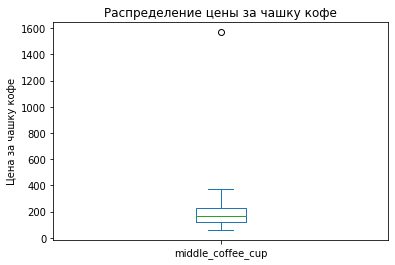

In [207]:
data['middle_coffee_cup'].plot(kind='box', xlabel='Чашка кофе', ylabel='Цена за чашку кофе', title='Распределение цены за чашку кофе')

plt.show()

Мы видим выброс цены за кофе - 1558рублей, посмотрим, что это такое.

In [208]:
data[data['middle_coffee_cup']==1568]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,большая семёновская улица,False


Думаю, здесь произошла ошибка при записи стольбца avg_bill и имелось в виду 230–290 рублей. за чашку кофе. И следовательно посчиталась не верно средняя цена. Исправим это.

In [209]:
data.loc[2859, 'avg_bill'] =  'Цена чашки капучино: 230-290 ₽'
data.loc[2859, 'avg_bill']

'Цена чашки капучино: 230-290 ₽'

In [210]:
data.loc[2859, 'middle_coffee_cup']=np.median(list(map(float, data.loc[2859, 'avg_bill'].split()[3].split('-'))))
data.loc[2859, 'middle_coffee_cup']


260.0

In [211]:
cofedistcap=data[data['category']=='кофейня'].groupby('district').middle_coffee_cup.median().sort_values(ascending=False).to_frame().reset_index()



cofedistcap

,district,middle_coffee_cup
0,Юго-Западный административный округ,198.0
1,Центральный административный округ,190.0
2,Западный административный округ,189.0
3,Северо-Западный административный округ,165.0
4,Северо-Восточный административный округ,162.5
5,Северный административный округ,159.0
6,Южный административный округ,150.0
7,Юго-Восточный административный округ,147.5
8,Восточный административный округ,135.0


Все исправили.

In [212]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofedistcap,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Стоит ориентироваться на стоимость чашки кофе от 135 рублей до 198, в зависимости от района. Самые высокие цены на чашки кофе в Юго-Западном административном округе, Центральном и Западном от 188 до 198 рублей. Ниже всего цена в Восточном административном округе 135 рублей.	

**Общий вывод**

Всего кофеен 1413, больше всего кофеен в Центральном округе 428, на втором месте Северный административный округ - 193 кофейни. Меньше всего в Северо-Западном административном округе.
Больше всего круглосуточных кофеен в Центральном административном округе-26. Меньше всего в Юго-Восточном административном округе и Южном административном округе, по 1 кофейне.

Самые высокие рейтинги в Центральном административном округе - 4.34 и в Северо-Западном административном округе - 4.33. Меньше всего в Западном административном округе - 4.20.

Стоит ориентироваться на стоимость чашки кофе от 135 рублей до 198, в зависимости от района. Самые высокие цены на чашки кофе в Юго-Западном административном округе, Центральном и Западном от 188 до 198 рублей. Ниже всего цена в Восточном административном округе 135 рублей.

Предлагаем открыть кофейню в центральном округе, так как там больше всех кофеен 428 из 1413.А также в центральном округе, среди категорий кофейня находится на третем месте. Также в центральном округе самый высокий чек за чашку кофе-190рублей, и самые высокие рейтинги в кафе-4,34, а конкретно на Ленинградском проспекте и Проспекте Мира. Это улицы входят в ТОП 15, и только на них присутсвуют кофейни.

Презентация: <https://cloud.mail.ru/public/QLrj/tRC7FfRKf>